# Ejercicio Delitos CDMX

### Luis Fernando López Corrales

05/02/2020

---

## Ejercicio A.2 Datos abiertos de la CDMX    

La Agencia Digital de Innovación Pública tiene disponibles los datos georeferenciados de las carpetas de investigación aportados por la PGJ. La tabla está disponible aquí: https://datos.cdmx.gob.mx/explore

#### Leyendo los datos

Este es el link de donde obtuve los datos de las Carpetas de investigación PGJ de la Ciudad de México: https://datos.cdmx.gob.mx/explore/dataset/carpetas-de-investigacion-pgj-de-la-ciudad-de-mexico/information/?disjunctive.ao_hechos&disjunctive.delito

In [2]:
import pandas as pd

In [3]:
df=pd.read_csv("D:/Documentos/Python for Data Projects/carpetas-de-investigacion-pgj-de-la-ciudad-de-mexico.csv")

In [3]:
df.shape

(931007, 18)

In [4]:
df.isnull().sum()

ao_hechos                  389
mes_hechos                 389
fecha_hechos               313
delito                       0
categoria_delito             0
fiscalia                     0
agencia                      0
unidad_investigacion       225
alcaldia_hechos           3086
colonia_hechos           37057
ao_inicio                    0
mes_inicio                   0
fecha_inicio                 0
calle_hechos              2506
calle_hechos2           558332
longitud                 36285
latitud                  36285
geopoint                 36285
dtype: int64

In [4]:
df.drop('calle_hechos2',axis=1,inplace=True)

In [6]:
df.isnull().sum()

ao_hechos                 389
mes_hechos                389
fecha_hechos              313
delito                      0
categoria_delito            0
fiscalia                    0
agencia                     0
unidad_investigacion      225
alcaldia_hechos          3086
colonia_hechos          37057
ao_inicio                   0
mes_inicio                  0
fecha_inicio                0
calle_hechos             2506
longitud                36285
latitud                 36285
geopoint                36285
dtype: int64

In [5]:
df=df.dropna()

In [6]:
df.shape #Al rededor de 40 mil rows eliminados.

(891884, 17)

In [9]:
df.colonia_hechos.value_counts()

CENTRO                                 32478
DOCTORES                               18931
DEL VALLE CENTRO                       14324
ROMA NORTE                             11762
NARVARTE                               10442
                                       ...  
VILLA DE LA NORIA                          1
BELEN DE LAS FLORES SECCION ORIENTE        1
SAN JUAN TEPENAHUAC                        1
LÁZARO TATA                                1
BELEN DE LAS FLORES SECCION TURBINA        1
Name: colonia_hechos, Length: 1630, dtype: int64

In [10]:
df.head()

,ao_hechos,mes_hechos,fecha_hechos,delito,categoria_delito,fiscalia,agencia,unidad_investigacion,alcaldia_hechos,colonia_hechos,ao_inicio,mes_inicio,fecha_inicio,calle_hechos,longitud,latitud,geopoint
1,2019.0,Septiembre,2019-09-30 14:15:00,RESISTENCIA DE PARTICULARES (SE OPONGA O RESISTA),DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN IZTAPALAPA,IZP-5,UI-3CD,IZTAPALAPA,ZONA URBANA EJIDAL SANTA MARIA AZTAHUACAN,2019,Septiembre,2019-09-30 15:59:24,PLAN DE AYALA Y OTILIO MONTAÑO,-99.031438,19.361161,"19.3611606998,-99.0314382997"
2,2019.0,Septiembre,2019-09-29 21:30:00,DAÑO EN PROPIEDAD AJENA INTENCIONAL A AUTOMOVIL,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-1SD,XOCHIMILCO,SAN GREGORIO ATLAPULCO,2019,Septiembre,2019-09-30 16:01:30,AV. MEXICO PTE.,-99.059522,19.253478,"19.2534775043,-99.0595222644"
3,2019.0,Septiembre,2019-09-30 13:05:00,ROBO A REPARTIDOR SIN VIOLENCIA,ROBO A REPARTIDOR CON Y SIN VIOLENCIA,INVESTIGACIÓN EN CUAUHTEMOC,CUH-7,UI-3SD,CUAUHTEMOC,ROMA NORTE,2019,Septiembre,2019-09-30 16:02:56,AV. OXACA,-99.168007,19.418058,"19.4180581996,-99.1680066996"
4,2019.0,Septiembre,2019-09-30 10:30:00,ROBO DE ACCESORIOS DE AUTO,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN ÁLVARO OBREGÓN,AO-4,UI-3SD,ALVARO OBREGON,PARQUE LAS AGUILAS,2019,Septiembre,2019-09-30 16:11:31,ROMULO O FARRIL Y CALZADA DE LAS AGUILAR,-99.215676,19.355090,"19.3550897428,-99.2156761097"
5,2019.0,Septiembre,2019-09-29 12:58:00,LESIONES CULPOSAS POR TRANSITO VEHICULAR EN CO...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN TLAHUAC,TLH-1,UI-3SD,TLAHUAC,CONCHITA B,2019,Septiembre,2019-09-30 16:18:22,ANTONIO SIERRA,-99.032631,19.287272,"19.2872718708,-99.0326314946"


In [11]:
df.dtypes

ao_hechos               float64
mes_hechos               object
fecha_hechos             object
delito                   object
categoria_delito         object
fiscalia                 object
agencia                  object
unidad_investigacion     object
alcaldia_hechos          object
colonia_hechos           object
ao_inicio                 int64
mes_inicio               object
fecha_inicio             object
calle_hechos             object
longitud                float64
latitud                 float64
geopoint                 object
dtype: object

In [12]:
df.describe()

,ao_hechos,ao_inicio,longitud,latitud
count,891884.000000,891884.000000,891884.000000,891884.000000
mean,2017.458722,2017.598443,-99.137410,19.388294
std,1.455580,1.096234,0.059005,0.068802
min,1906.000000,2016.000000,-99.342765,19.095354
25%,2017.000000,2017.000000,-99.175062,19.341979
50%,2018.000000,2018.000000,-99.142575,19.391282
75%,2018.000000,2019.000000,-99.100985,19.437535
max,2019.000000,2019.000000,-98.946873,19.582490


In [13]:
df.ao_hechos.value_counts().head(35) #Se podría omitir la información del 2016 hacia atrás..

2018.0    241801
2019.0    222344
2017.0    216485
2016.0    186362
2015.0     14738
2014.0      3706
2013.0      1781
2012.0      1193
2011.0       817
2010.0       657
2009.0       360
2008.0       336
2007.0       227
2006.0       193
2001.0       154
2005.0       126
2004.0       106
2003.0        72
2000.0        52
2002.0        46
1998.0        33
1997.0        26
1999.0        23
1996.0        20
1992.0        19
1989.0        17
1994.0        17
1993.0        17
1995.0        16
1990.0        15
1987.0        13
1984.0        11
1991.0        10
1983.0        10
1969.0         6
Name: ao_hechos, dtype: int64

### 1. ¿Qué pruebas identificarías para asegurar la calidad de estos datos? No es necesario hacerlas. Sólo describe la prueba y qué te dice cada una. 

**a. Verificar que el tipo de las variables corresponda con sus valores:** esto te permitiría poder realizar operaciones de acuerdo a los verdaderos tipos de datos. Por ejemplo, puede ser que una columna numérica estaba como 'string' en un principio y, ahora que la pasas a numérica, podrás realizar operaciones. O también, que la variable 'fecha' vienen como 'string'. El hecho de convertir esta columna a 'datetime' te permite realizar analisis con la variable del tiempo.

**b. Obtener los NULLS o NA's:** te permite eliminar o rellenar datos que no tienen peso dentro del análisis, y que solo pueden representar una traba para poder realizar modelos, gráficas o estadísticos.

**c. Verificar si existen columnas duplicadas:** esto te ayuda a reducir el peso de tu dataset, haciendo que tu análisis pueda ser más rápido. Además, dentro de un modelo de machine learning, te permite evitar sesgos.

**d. Verificar la sintaxis en las columnas tipo string:** puede ser que dentro de una columna existan varios valores que hagan referencia a uno solo. Por ejemplo, en un data set donde existe la columna de 'estado' y hay varios valores como 'Jalisco', 'jalisco', Halisco', 'halisco', 'Jalisco, jalisco'... se puede inferir que estos hacen referencia a 'Jalisco'.

**e. Verificar la uniformidad de las unidades utilizadas para las columnas numéricas:** podría pasar que para una columna que haga referencia al 'tipo de moneda', existan varios tipos, y si deseas hacer operaciones, sería conveniente pasar todos los tipos a uno sola divisa.

### 2. ¿Cuántos delitos registrados hay en la tabla? ¿Qué rango de tiempo consideran los datos? 

In [15]:
df.delito.nunique() #Número de delitos únicos

276

In [7]:
df.fecha_hechos=pd.to_datetime(df.fecha_hechos)

In [17]:
df.fecha_hechos.min(), df.fecha_hechos.max() #rango de fechas en los datos

(Timestamp('1906-06-02 19:00:00'), Timestamp('2019-12-31 22:40:00'))

Hay un total de 276 delitos únicos en los datos, mismos que van desde un registro en el año 1906 hasta el 31 de diciembre del año pasado.

### 3. ¿Cómo se distribuye el número de delitos en la CDMX? ¿Cuáles son los 5 delitos más frecuentes? 

In [18]:
df.delito.value_counts().head() #5 delitos más frecuentes

VIOLENCIA FAMILIAR                                80932
ROBO A NEGOCIO SIN VIOLENCIA                      60032
ROBO DE OBJETOS                                   57662
FRAUDE                                            52048
ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA    48309
Name: delito, dtype: int64

In [19]:
df3=pd.DataFrame(df.delito.value_counts())

In [20]:
df3['n_delito']=[i for i in range(1,277)] #creo una columna de # de delito, que puede ser como ID delito, para luego plotear.

In [21]:
df3.head()

,delito,n_delito
VIOLENCIA FAMILIAR,80932,1
ROBO A NEGOCIO SIN VIOLENCIA,60032,2
ROBO DE OBJETOS,57662,3
FRAUDE,52048,4
ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA,48309,5


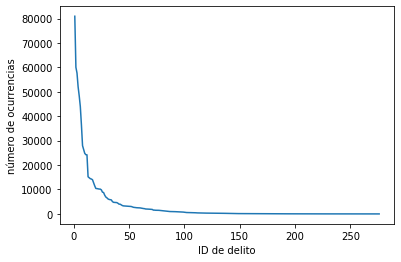

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(df3.n_delito, df3.delito);
plt.xlabel("ID de delito");
plt.ylabel("número de ocurrencias");

Con base a la gráfica pasada, podemos decir que el número de delitos se distribuye exponencialmente. La mayoría de las ocurrencias estan dentro del 20% de los delitos. Y los delitos más frecuentes en los datos son: VIOLENCIA FAMILIAR, ROBO A NEGOCIO SIN VIOLENCIA, ROBO DE OBJETOS, FRAUDE,ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA.

 ### 4. Identifica los delitos que van a la alza y a la baja en la CDMX en el último año (ten cuidado con los delitos con pocas ocurrencias).  

In [23]:
df4=pd.DataFrame(df[df.ao_hechos == 2019].delito.value_counts().head(15)) #Obtengo los 15 delitos más ocurrentes en el 2019

In [24]:
[i for i in df4.index] #15 delitos más ocurrentes en 2019 en una lista

['VIOLENCIA FAMILIAR',
 'ROBO A NEGOCIO SIN VIOLENCIA',
 'AMENAZAS',
 'ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA',
 'ROBO DE OBJETOS',
 'FRAUDE',
 'ROBO DE ACCESORIOS DE AUTO',
 'ROBO DE OBJETOS DEL INTERIOR DE UN VEHICULO',
 'ROBO DE VEHICULO DE SERVICIO PARTICULAR SIN VIOLENCIA',
 'ROBO A CASA HABITACION SIN VIOLENCIA',
 'FALSIFICACION DE TITULOS AL PORTADOR Y DOCUMENTOS DE CREDITO PUBLICO',
 'NARCOMENUDEO POSESION SIMPLE',
 'ROBO A NEGOCIO CON VIOLENCIA',
 'ROBO A PASAJERO / CONDUCTOR DE VEHICULO CON VIOLENCIA',
 'DAÑO EN PROPIEDAD AJENA CULPOSA POR TRÁNSITO VEHICULAR A AUTOMOVIL']

In [25]:
df4=df.loc[(df.delito.isin([i for i in df4.index]) == True)] #el dataframe original filtrado por los 15 delitos más ocurrentes del 2019

In [26]:
df4.shape

(523259, 17)

In [27]:
df4_2=df4[df.fecha_hechos.dt.year >= 2016]

C:\Users\luisf\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


In [28]:
df4_2.shape

(511972, 17)

In [29]:
df4_2.fecha_hechos.dt.year.value_counts()

2018    150688
2019    138156
2017    119058
2016    104070
Name: fecha_hechos, dtype: int64

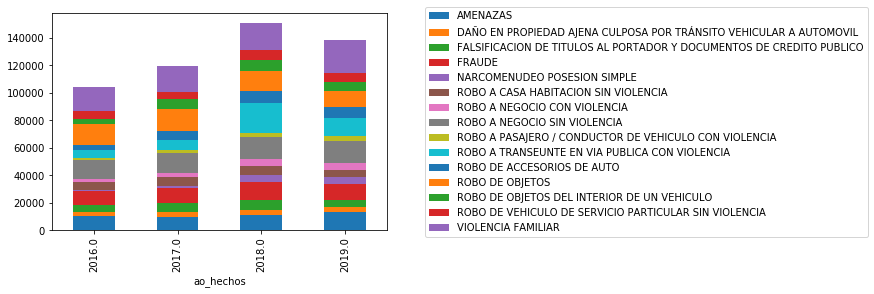

In [30]:
#import matplotlib.pyplot as plt
#%matplotlib inline
df4_2.groupby(['ao_hechos','delito']).size().unstack().plot(kind='bar',stacked=True)
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

Comportamiento de los 15 delitos más ocurrentes del 2019, a través del año 2016 en adelante:
- ROBO DE OBJETOS ha disminuido durante dos años consecutivos (a la baja).
- ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA tuvo un aumento muy grande en 2018 y en 2019 bajo algo. Sin embargo, sigue siendo mucho mayor que los años 2016 y 2017 (al alza).
- NARCOMENUDEO POSESION SIMPLE va a la alza, tiene 4 años consecutivos con un incremento visible. (al alza).

### 5. ¿Cuál es la alcaldía que más delitos tiene y cuál es la que menos? ¿Por qué crees que sea esto?

In [31]:
df.groupby('alcaldia_hechos').agg({'delito':'count'}).sort_values('delito',ascending=False)

,delito
alcaldia_hechos,
CUAUHTEMOC,143660
IZTAPALAPA,133028
GUSTAVO A MADERO,88636
BENITO JUAREZ,79038
COYOACAN,60599
MIGUEL HIDALGO,60379
ALVARO OBREGON,59849
TLALPAN,51899
VENUSTIANO CARRANZA,51684


A excepción de Iztapalapa, las delegaciones con menos número de delitos son las delegaciones que cuentan con los niveles socioeconómicos más bajos de la CDMX. Es decir, los delincuentes se enfocan en delegaciones con niveles socioeconómicos altos, como lo evidencia el primer lugar que es Cuahtemoc, Gustavo A Madero, Benito Juarez...

### 6. Dentro de cada alcaldía, cuáles son las tres colonias con más delitos

In [32]:
df6=df.groupby(['alcaldia_hechos','colonia_hechos'],as_index=False).agg({'delito':'count'}) #****
df6.head()

,alcaldia_hechos,colonia_hechos,delito
0,ALVARO OBREGON,19 DE MAYO,48
1,ALVARO OBREGON,1A AMPLIACIÓN PRESIDENTES,292
2,ALVARO OBREGON,1A VICTORIA,221
3,ALVARO OBREGON,1ER REACOMODO CORPUS CHRISTI,27
4,ALVARO OBREGON,2A AMPLIACIÓN EL PIRU,110


In [33]:
df6_2=df6.groupby('alcaldia_hechos').apply(lambda x: x.nlargest(3, 'delito'))
df6_2

alcaldia_hechos  \
alcaldia_hechos                                       
ALVARO OBREGON         118           ALVARO OBREGON   
                       220           ALVARO OBREGON   
                       256           ALVARO OBREGON   
AZCAPOTZALCO           276             AZCAPOTZALCO   
                       286             AZCAPOTZALCO   
                       268             AZCAPOTZALCO   
BENITO JUAREZ          366            BENITO JUAREZ   
                       382            BENITO JUAREZ   
                       389            BENITO JUAREZ   
COYOACAN               496                 COYOACAN   
                       407                 COYOACAN   
                       442                 COYOACAN   
CUAJIMALPA DE MORELOS  568    CUAJIMALPA DE MORELOS   
                       551    CUAJIMALPA DE MORELOS   
                       575    CUAJIMALPA DE MORELOS   
CUAUHTEMOC             590               CUAUHTEMOC   
                       594               CUAUHTEMOC   
                       608               CUAUHTEMOC   
GUSTAVO A MADERO       730         GUSTAVO A MADERO   
                       698         GUSTAVO A MADERO   
                       765         GUSTAVO A MADERO   
IZTACALCO              814                IZTACALCO   
                       815                IZTACALCO   
                       827                IZTACALCO   
IZTAPALAPA             899               IZTAPALAPA   
                       976               IZTAPALAPA   
                       909               IZTAPALAPA   
LA MAGDALENA CONTRERAS 1127  LA MAGDALENA CONTRERAS   
                       1128  LA MAGDALENA CONTRERAS   
                       1124  LA MAGDALENA CONTRERAS   
MIGUEL HIDALGO         1190          MIGUEL HIDALGO   
                       1144          MIGUEL HIDALGO   
                       1168          MIGUEL HIDALGO   
MILPA ALTA             1212              MILPA ALTA   
                       1246              MILPA ALTA   
                       1239              MILPA ALTA   
TLAHUAC                1262                 TLAHUAC   
                       1296                 TLAHUAC   
                       1307                 TLAHUAC   
TLALPAN                1490                 TLALPAN   
                       1398                 TLALPAN   
                       1522                 TLALPAN   
VENUSTIANO CARRANZA    1594     VENUSTIANO CARRANZA   
                       1602     VENUSTIANO CARRANZA   
                       1626     VENUSTIANO CARRANZA   
XOCHIMILCO             1721              XOCHIMILCO   
                       1744              XOCHIMILCO   
                       1737              XOCHIMILCO   

                                               colonia_hechos  delito  
alcaldia_hechos                                                        
ALVARO OBREGON         118              JARDINES DEL PEDREGAL    2746  
                       220                          SAN ANGEL    2351  
                       256                     ZEDEC SANTA FE    2176  
AZCAPOTZALCO           276                         EL ROSARIO    3197  
                       286                 INDUSTRIAL VALLEJO    2181  
                       268             CENTRO DE AZCAPOTZALCO    2020  
BENITO JUAREZ          366                   DEL VALLE CENTRO   14324  
                       382                           NARVARTE   10442  
                       389                       PORTALES SUR    5186  
COYOACAN               496          PEDREGAL DE SANTO DOMINGO    5168  
                       407                             AJUSCO    2806  
                       442                         DEL CARMEN    2702  
CUAJIMALPA DE MORELOS  568                  LOMAS DE SANTA FE    1957  
                       551                         CUAJIMALPA    1944  
                       575             SAN JOSÉ DE LOS CEDROS    1225  
CUAUHTEMOC             590                             CENTRO

La variable df6_2 contiene las 3 colonías con más delitos, agrupadas por alcaldía. Ahí se puede ver, por ejemplo, que para la alcaldía Cuahtemoc, las tres colonias con más delitos son: CENTRO, DOCTORES y ROMA NORTE

### 7. ¿Existe alguna tendencia estacional en la ocurrencia de delitos (mes, semana, día de la semana, quincenas)?

In [34]:
df.fecha_hechos.dt.year.value_counts().head(10) #Por años no tiene caso ver tendencias, ya que para los años atrás de 2016,
#no hay muchos registros de delitos en esta base de datos. Aunque con el paso de los años, las denuncias han ido aumentando.

2018    241801
2019    222344
2017    216485
2016    186362
2015     14738
2014      3706
2013      1781
2012      1193
2011       817
2010       657
Name: fecha_hechos, dtype: int64

In [35]:
df.groupby(df.fecha_hechos.dt.month).delito.count() #Por mes

fecha_hechos
1     71074
2     69687
3     75430
4     72268
5     78242
6     73559
7     73708
8     77102
9     74897
10    79647
11    74912
12    71358
Name: delito, dtype: int64

In [36]:
df.groupby(df.fecha_hechos.dt.week).delito.count() #Por semana

fecha_hechos
1     15474
2     16122
3     16478
4     16156
5     17186
6     16698
7     17568
8     17172
9     18075
10    17085
11    17577
12    16136
13    16831
14    17500
15    16460
16    16572
17    16922
18    17308
19    16927
20    18050
21    17800
22    18198
23    17528
24    16974
25    16848
26    16718
27    17019
28    17141
29    16478
30    16177
31    17396
32    16980
33    17543
34    17239
35    18481
36    17539
37    17078
38    16864
39    17625
40    18244
41    18187
42    18265
43    17347
44    16914
45    17609
46    17836
47    17001
48    17993
49    17320
50    17228
51    16216
52    13879
53     1922
Name: delito, dtype: int64

In [37]:
df.groupby(df.fecha_hechos.dt.weekday).delito.count() #Por día de la semana
# date.weekday() Return the day of the week as an integer, where Monday is 0 and Sunday is 6

fecha_hechos
0    133722
1    133097
2    134071
3    132579
4    139502
5    115841
6    103072
Name: delito, dtype: int64

In [38]:
df.groupby(df.fecha_hechos.dt.hour).delito.count() #por horas del día

fecha_hechos
0      19575
1      14196
2      12824
3      12328
4      10791
5      13589
6      20555
7      28078
8      33793
9      41015
10     57298
11     45528
12    108050
13     46895
14     50033
15     49719
16     45930
17     43198
18     44518
19     44877
20     47091
21     41577
22     34259
23     26167
Name: delito, dtype: int64

Conclusiones:
- No existen patrones por mes, los datos se distribuyen uniformemente cuando se agrupan los delitos por mes.
- La última semana del año (52) tiene un conteo de delitos extremadamente bajo, en comparación a las demás semanas.
- La mayoría de los delitos se realizan entre semana, mientras que los fines de semana disminuyen entre un 20-30%
- En la agrupación por horas es donde más se encuentran patrones: a las 12 pm hay un aumento muy grande en el número de delitos. Y existe una diferencia significativa entre el número de delitos que se cometen entre 9am-9pm y 10pm-8am. Tiene sentido, ya que entre 10pm-8am- las personas generalmente duermen, al contrario, entre 9am-9pm hay más actividad.

### 8. ¿Cuales son los delitos que más caracterizan a cada alcaldía? Es decir, delitos que suceden con mayor frecuencia en una alcaldía y con menor frecuencia en las demás.

In [39]:
df8=df.groupby(['alcaldia_hechos','delito']).delito.count()
df8=pd.DataFrame(df8).rename(columns={'delito':'conteo'}).reset_index()
df8

,alcaldia_hechos,delito,conteo
0,ALVARO OBREGON,ABANDONO DE PERSONA,194
1,ALVARO OBREGON,ABORTO,30
2,ALVARO OBREGON,ABUSO DE AUTORIDAD,288
3,ALVARO OBREGON,ABUSO DE CONFIANZA,981
4,ALVARO OBREGON,ABUSO SEXUAL,555
...,...,...,...
3468,XOCHIMILCO,VIOLACION EQUIPARADA POR CONOCIDO,2
3469,XOCHIMILCO,VIOLACION EQUIPARADA Y ROBO DE VEHICULO,1
3470,XOCHIMILCO,VIOLACION TUMULTUARIA,5
3471,XOCHIMILCO,VIOLACION TUMULTUARIA EQUIPARADA POR CONOCIDO,1


Top 3 delitos por alcaldía

In [40]:
df8_2=df8.groupby('alcaldia_hechos',as_index=False).apply(lambda x: x.nlargest(3, 'conteo')) 
df8_2=df8_2.rename(columns={'conteo':'conteo_head'})
df8_2 #los top 3 delitos por cada alcaldía

alcaldia_hechos  \
0  224           ALVARO OBREGON   
   131           ALVARO OBREGON   
   185           ALVARO OBREGON   
1  441             AZCAPOTZALCO   
   347             AZCAPOTZALCO   
   402             AZCAPOTZALCO   
2  502            BENITO JUAREZ   
   572            BENITO JUAREZ   
   617            BENITO JUAREZ   
3  889                 COYOACAN   
   792                 COYOACAN   
   846                 COYOACAN   
4  1075   CUAJIMALPA DE MORELOS   
   1001   CUAJIMALPA DE MORELOS   
   937    CUAJIMALPA DE MORELOS   
5  1147              CUAUHTEMOC   
   1286              CUAUHTEMOC   
   1225              CUAUHTEMOC   
6  1569        GUSTAVO A MADERO   
   1469        GUSTAVO A MADERO   
   1509        GUSTAVO A MADERO   
7  1782               IZTACALCO   
   1728               IZTACALCO   
   1746               IZTACALCO   
8  2027              IZTAPALAPA   
   1964              IZTAPALAPA   
   1923              IZTAPALAPA   
9  2214  LA MAGDALENA CONTRERAS   
   2035  LA MAGDALENA CONTRERAS   
   2139  LA MAGDALENA CONTRERAS   
10 2271          MIGUEL HIDALGO   
   2396          MIGUEL HIDALGO   
   2342          MIGUEL HIDALGO   
11 2598              MILPA ALTA   
   2444              MILPA ALTA   
   2533              MILPA ALTA   
12 2806                 TLAHUAC   
   2606                 TLAHUAC   
   2750                 TLAHUAC   
13 3037                 TLALPAN   
   2941                 TLALPAN   
   2996                 TLALPAN   
14 3252     VENUSTIANO CARRANZA   
   3213     VENUSTIANO CARRANZA   
   3075     VENUSTIANO CARRANZA   
15 3472              XOCHIMILCO   
   3260              XOCHIMILCO   
   3412              XOCHIMILCO   

                                                 delito  conteo_head  
0  224                               VIOLENCIA FAMILIAR         6035  
   131                     ROBO A NEGOCIO SIN VIOLENCIA         3897  
   185                                  ROBO DE OBJETOS         3468  
1  441                               VIOLENCIA FAMILIAR         3758  
   347                     ROBO A NEGOCIO SIN VIOLENCIA         3694  
   402                                  ROBO DE OBJETOS         2884  
2  502                                           FRAUDE         7429  
   572                     ROBO A NEGOCIO SIN VIOLENCIA         7098  
   617                       ROBO DE ACCESORIOS DE AUTO         6246  
3  889                               VIOLENCIA FAMILIAR         5323  
   792                     ROBO A NEGOCIO SIN VIOLENCIA         4722  
   846                                  ROBO DE OBJETOS         4435  
4  1075                              VIOLENCIA FAMILIAR         1471  
   1001                    ROBO A NEGOCIO SIN VIOLENCIA         1106  
   937                                           FRAUDE          930  
5  1147                                          FRAUDE        13653  
   1286                                 ROBO DE OBJETOS        11407  
   1225                    ROBO A NEGOCIO SIN VIOLENCIA         9570  
6  1569                              VIOLENCIA FAMILIAR         9079  
   1469                    ROBO A NEGOCIO SIN VIOLENCIA         6392  
   1509  ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA         4853  
7  1782                              VIOLENCIA FAMILIAR         5081  
   1728  ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA         2697  
   1746                                 ROBO DE OBJETOS         2047  
8  2027                              VIOLENCIA FAMILIAR        15386  
   1964  ROBO A TRANSEUNTE EN VIA PUBLICA CON VIOLENCIA         9649  
   1923                    ROBO A NEGOCIO SIN VIOLENCIA         9410  
9  2214                              VIOLENCIA FAMILIAR         2938  
   2035                                        AMENAZAS         1028  
   2139            ROBO A CASA HABITACION SIN VIOLENCIA          705  
10 2271                                          FRAUDE         5292  
   2396                     

Los 3 últimos delitos demandados por alcaldía.

In [41]:
df8_3=df8[df8.conteo > 200].groupby('alcaldia_hechos',as_index=False).apply(lambda x: x.nsmallest(3, 'conteo')) #los últimos 3 delitos por cada alcaldía
df8_3=df8_3.rename(columns={'conteo':'conteo_tail'})
df8_3

alcaldia_hechos  \
0  83            ALVARO OBREGON   
   197           ALVARO OBREGON   
   121           ALVARO OBREGON   
1  227             AZCAPOTZALCO   
   362             AZCAPOTZALCO   
   401             AZCAPOTZALCO   
2  562            BENITO JUAREZ   
   530            BENITO JUAREZ   
   522            BENITO JUAREZ   
3  712                 COYOACAN   
   752                 COYOACAN   
   743                 COYOACAN   
4  909    CUAJIMALPA DE MORELOS   
   961    CUAJIMALPA DE MORELOS   
   924    CUAJIMALPA DE MORELOS   
5  1209              CUAUHTEMOC   
   1101              CUAUHTEMOC   
   1289              CUAUHTEMOC   
6  1453        GUSTAVO A MADERO   
   1429        GUSTAVO A MADERO   
   1414        GUSTAVO A MADERO   
7  1593               IZTACALCO   
   1739               IZTACALCO   
   1572               IZTACALCO   
8  1951              IZTAPALAPA   
   1800              IZTAPALAPA   
   1985              IZTAPALAPA   
9  2044  LA MAGDALENA CONTRERAS   
   2048  LA MAGDALENA CONTRERAS   
   2064  LA MAGDALENA CONTRERAS   
10 2317          MIGUEL HIDALGO   
   2358          MIGUEL HIDALGO   
   2297          MIGUEL HIDALGO   
11 2568              MILPA ALTA   
   2533              MILPA ALTA   
   2444              MILPA ALTA   
12 2740                 TLAHUAC   
   2776                 TLAHUAC   
   2616                 TLAHUAC   
13 2995                 TLALPAN   
   3007                 TLALPAN   
   2857                 TLALPAN   
14 3118     VENUSTIANO CARRANZA   
   3229     VENUSTIANO CARRANZA   
   3102     VENUSTIANO CARRANZA   
15 3446              XOCHIMILCO   
   3428              XOCHIMILCO   
   3442              XOCHIMILCO   

                                                    delito  conteo_tail  
0  83                               LESIONES INTENCIONALES          203  
   197   ROBO DE VEHICULO DE SERVICIO PÚBLICO SIN VIOLE...          205  
   121                           QUEBRANTAMIENTO DE SELLOS          208  
1  227                                  ABUSO DE AUTORIDAD          212  
   362   ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO ...          257  
   401                   ROBO DE MOTOCICLETA SIN VIOLENCIA          264  
2  562                           QUEBRANTAMIENTO DE SELLOS          202  
   530                        NARCOMENUDEO POSESION SIMPLE          216  
   522            LESIONES CULPOSAS POR TRANSITO VEHICULAR          222  
3  712                                       ENCUBRIMIENTO          204  
   752   NARCOMENUDEO POSESIÓN CON FINES DE VENTA, COME...          212  
   743            LESIONES CULPOSAS POR TRANSITO VEHICULAR          231  
4  909                 DAÑO EN PROPIEDAD AJENA INTENCIONAL          227  
   961                   LESIONES INTENCIONALES POR GOLPES          281  
   924                                             DESPOJO          289  
5  1209                             PORTACION ARMA/PROHIB.          203  
   1101  DAÑO EN PROPIEDAD AJENA CULPOSA POR TRÁNSITO V...          207  
   1289                         ROBO DE PLACA DE AUTOMOVIL          234  
6  1453                             PORTACION ARMA/PROHIB.          211  
   1429                      NEGACION DEL SERVICIO PUBLICO          220  
   1414                                  LESIONES CULPOSAS          225  
7  1593    DAÑO EN PROPIEDAD AJENA INTENCIONAL A AUTOMOVIL          213  
   1739                                     ROBO DE DINERO          220  
   1572                                 ABUSO DE AUTORIDAD          235  
8  1951         ROBO A REPARTIDOR Y VEHICULO CON VIOLENCIA          201  
   1800                       CONTRA FUNCIONARIOS PUBLICOS          226  
   1985                         ROBO DE PLACA DE AUTOMOVIL          229  
9  2044                    DAÑO EN PROPIEDAD AJENA CULPOSA          201  
   2048                DAÑO EN PROPIEDAD AJENA INTENCIONAL          241  
   2064                                            DESPOJO          264  
10 231

In [42]:
df8_final=pd.merge(df8_2, df8_3,on='delito').head(50)
df8_final

,alcaldia_hechos_x,delito,conteo_head,alcaldia_hechos_y,conteo_tail
0,ALVARO OBREGON,ROBO DE OBJETOS,3468,MILPA ALTA,205
1,AZCAPOTZALCO,ROBO DE OBJETOS,2884,MILPA ALTA,205
2,COYOACAN,ROBO DE OBJETOS,4435,MILPA ALTA,205
3,CUAUHTEMOC,ROBO DE OBJETOS,11407,MILPA ALTA,205
4,IZTACALCO,ROBO DE OBJETOS,2047,MILPA ALTA,205
5,MIGUEL HIDALGO,ROBO DE OBJETOS,5280,MILPA ALTA,205
6,TLALPAN,ROBO DE OBJETOS,3325,MILPA ALTA,205
7,VENUSTIANO CARRANZA,ROBO DE OBJETOS,3609,MILPA ALTA,205
8,LA MAGDALENA CONTRERAS,AMENAZAS,1028,MILPA ALTA,381
9,MILPA ALTA,AMENAZAS,381,MILPA ALTA,381


- Aca obtuve los delitos con más ocurrencias por alcaldía, y los puse en df8_2. 
- Después obtuve los delitos relativamente con menos ocurrencias por alcaldía (por eso el filtro en df8.conteo > 200) y los guarde en df8_3.

La idea fue hacer un Join para ver si alguno de esos delitos con más ocurrencias estaba en los delitos relativamente menos ocurridos. El resultado fue df8_final. Este análisis nos puede dar una idea de los delitos que más ocurren en ciertas delegaciones pero no son de lo menos ocurrentes en otras.

Se puede observar que los delitos ROBO DE OBJETOS, AMENAZAS Y ROBO A CASA HABITACION SIN VIOLENCIA son delitos muy denunciados en alcaldías como ALVARO OBREGON, AZCAPOTZALCO, COYOACAN, CUAHTEMOC, IZTACALCO, MIGUEL HIDALGO, TLALPAN, VENUSTIANO CARRANZA, XOCHIMILCO, y son de los menos ocurrentes en la delegación MILPA ALTA.

### 9. Calcula el número de homicidios dolosos por cada 100 mil habitantes anual para cada Área Geoestadística Básica (AGEB) del INEGI. (hint: no importa que el dato de población no esté actualizado).  
#### a) Pinta un mapa con este indicador. Describe los resultados.  

- Población total de la CDMX: Según INEGI (http://cuentame.inegi.org.mx/monografias/informacion/df/poblacion/) en el 2015 fuimos 8,918,653

In [8]:
poblacion = 8918653

In [9]:
#Número de homicidios dolosos
df[df.delito.str.contains("HOMICIDIO")].delito.value_counts()

HOMICIDIO POR ARMA DE FUEGO                               3050
HOMICIDIO CULPOSO POR TRÁNSITO VEHICULAR (ATROPELLADO)    1024
HOMICIDIO CULPOSO POR TRÁNSITO VEHICULAR (COLISION)        759
HOMICIDIO POR ARMA BLANCA                                  598
HOMICIDIOS INTENCIONALES (OTROS)                           368
TENTATIVA DE HOMICIDIO                                     333
HOMICIDIO POR GOLPES                                       300
HOMICIDIO CULPOSO POR TRÁNSITO VEHICULAR                   131
HOMICIDIO CULPOSO POR ARMA DE FUEGO                        118
HOMICIDIO CULPOSO POR TRÁNSITO VEHICULAR (CAIDA)            94
HOMICIDIO CULPOSO                                           32
HOMICIDIO CULPOSO FUERA DEL D.F (ATROPELLADO)               18
HOMICIDIO POR AHORCAMIENTO                                  14
HOMICIDIO CULPOSO FUERA DEL D.F (COLISION)                   5
HOMICIDIO CULPOSO POR INSTRUMENTO PUNZO CORTANTE             5
Name: delito, dtype: int64

Tomare en cuenta todos los valores anteriores como un Homicidio Doloso menos el valor TENTATIVA DE HOMICIDIO

In [10]:
(df[df.delito.str.contains("HOMICIDIO")].delito.value_counts().sum())-333 #333 es el valor de TENTATIVA DE HOMICIDIO

6516

In [11]:
#Filtrar el dataset por los valores de homicidio
df9=df[(df.delito.str.contains("HOMICIDIO")) & (df.delito != 'TENTATIVA DE HOMICIDIO')]
df9

,ao_hechos,mes_hechos,fecha_hechos,delito,categoria_delito,fiscalia,agencia,unidad_investigacion,alcaldia_hechos,colonia_hechos,ao_inicio,mes_inicio,fecha_inicio,calle_hechos,longitud,latitud,geopoint
126,2019.0,Septiembre,2019-09-15 12:24:00,HOMICIDIO POR ARMA DE FUEGO,HOMICIDIO DOLOSO,INVESTIGACIÓN PARA LA ATENCIÓN DEL DELITO DE H...,HOM-2,1 CON DETENIDO 1 C/D,GUSTAVO A MADERO,AMPLIACIÓN GABRIEL HERNÁNDEZ,2019,Septiembre,2019-09-15 12:38:17,CALLE RETEN DE AGUA,-99.108537,19.505676,"19.5056763421,-99.108536657"
142,2019.0,Septiembre,2019-09-15 12:40:00,HOMICIDIO CULPOSO POR TRÁNSITO VEHICULAR (COLI...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN TLALPAN,TLP-4,UI-3CD,BENITO JUAREZ,PORTALES SUR,2019,Septiembre,2019-09-15 14:56:31,KILOMETRO 42,-99.141758,19.369326,"19.3693259014,-99.1417583004"
144,2019.0,Septiembre,2019-09-15 02:30:00,HOMICIDIO POR ARMA DE FUEGO,HOMICIDIO DOLOSO,INVESTIGACIÓN EN IZTAPALAPA,IZP-5,UI-3CD,IZTAPALAPA,CERRO DE LA ESTRELLA,2019,Septiembre,2019-09-15 15:11:18,AVENIDA 11,-99.082651,19.327496,"19.3274961997,-99.0826513053"
178,2019.0,Septiembre,2019-09-15 17:40:00,HOMICIDIO CULPOSO POR TRÁNSITO VEHICULAR (ATRO...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN ÁLVARO OBREGÓN,AO-3,UI-3CD,ALVARO OBREGON,TOLTECA,2019,Septiembre,2019-09-15 18:13:17,CALLE 4,-99.191684,19.391042,"19.3910416633,-99.1916839889"
220,2019.0,Septiembre,2019-09-16 03:20:00,HOMICIDIO CULPOSO POR ARMA DE FUEGO,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN IZTAPALAPA,IZP-5,UI-3CD,IZTAPALAPA,FRANCISCO VILLA,2019,Septiembre,2019-09-16 05:06:31,SEGUNDA CERRADA DE FRANCISCO VILLA ESQUINA CON...,-99.059182,19.337688,"19.3376877957,-99.0591821004"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930168,2019.0,Diciembre,2019-12-26 23:30:00,HOMICIDIO POR ARMA DE FUEGO,HOMICIDIO DOLOSO,INVESTIGACIÓN EN GUSTAVO A. MADERO,GAM-3,UI-3SD,GUSTAVO A MADERO,CASTILLO GRANDE,2019,Diciembre,2019-12-27 07:31:41,AV. DEL FUERTE,-99.137903,19.538636,"19.5386359608,-99.1379026337"
930300,2019.0,Diciembre,2019-12-27 16:00:00,HOMICIDIO POR ARMA DE FUEGO,HOMICIDIO DOLOSO,INVESTIGACIÓN EN TLAHUAC,TLH-1,UI-1SD,TLAHUAC,SANTA ANA SUR,2019,Diciembre,2019-12-27 18:11:02,MAGDALENO ITA,-99.037773,19.295707,"19.2957072639,-99.0377730156"
930322,2019.0,Diciembre,2019-12-27 18:40:00,HOMICIDIO POR ARMA BLANCA,HOMICIDIO DOLOSO,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-1CD,XOCHIMILCO,SANTIAGO TEPALCATLALPAN,2019,Diciembre,2019-12-27 19:34:27,MAIZ,-99.113420,19.254876,"19.2548759029,-99.1134198996"
930520,2019.0,Diciembre,2019-12-28 23:31:00,HOMICIDIO CULPOSO POR TRÁNSITO VEHICULAR (COLI...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN AZCAPOTZALCO,AZ-4,UI-2SD,AZCAPOTZALCO,PLENITUD,2019,Diciembre,2019-12-29 00:32:38,CAMINO A SANTA LUCIA,-99.199522,19.474216,"19.4742159226,-99.1995224589"


In [12]:
def homicidios_anual_100mil(n_delitos):
    #n_delitos es el número de delitos
    return (n_delitos/poblacion)*100000

homicidios_anual_100mil(6516) #Este es el total de homicidios dolosos x 100mil habitantes en la CDMX

73.06036012388866

Estuve investigando cómo incluir el AGEB para esta pregunta, sin embargo, se me ha estado complicando. Es por esto que decidí sacar la tasa por delegación.

In [13]:
df9_2=df9.groupby('alcaldia_hechos').delito.count().to_frame()
df9_2

,delito
alcaldia_hechos,
ALVARO OBREGON,485
AZCAPOTZALCO,244
BENITO JUAREZ,157
COYOACAN,291
CUAJIMALPA DE MORELOS,117
CUAUHTEMOC,651
GUSTAVO A MADERO,962
IZTACALCO,253
IZTAPALAPA,1382


In [14]:
df9_2['homicidios_anual_100mil']=homicidios_anual_100mil(df9_2.delito) #aplico la función creada para generar una columna nueva con el valor de la tasa
df9_2

,delito,homicidios_anual_100mil
alcaldia_hechos,,
ALVARO OBREGON,485,5.438041
AZCAPOTZALCO,244,2.735839
BENITO JUAREZ,157,1.760356
COYOACAN,291,3.262825
CUAJIMALPA DE MORELOS,117,1.311857
CUAUHTEMOC,651,7.299309
GUSTAVO A MADERO,962,10.786382
IZTACALCO,253,2.836751
IZTAPALAPA,1382,15.495614


df9_2 contiene las tasas de homicidios anuales por cada 100 mil habitantes, por delegación. En Iztapalapa esta la mayor tasa, donde por cada 100 mil personas matan por Homicidio Doloso a 15 personas.

Ahora, pintando un scatter map

In [15]:
df_plot=df9.merge(df9_2, how='left',on='alcaldia_hechos') #Para agregar al dataset filtrado por homicidios, la tasa obtenida

In [16]:
import plotly.express as px
mapbox_access_token = "pk.eyJ1IjoibHVpc2ZlcmxjMTUxNSIsImEiOiJjazUydm50ZjIwMjUxM2pudzFkMDhkaTYwIn0.NQDEMChu5p542DxB9j7d7g" 
#mi token público para mapbox, solo para dar un estilo diferente al default

fig = px.scatter_mapbox(df_plot, lat="latitud", lon="longitud", hover_name="alcaldia_hechos", hover_data=["delito_x", "homicidios_anual_100mil", "colonia_hechos"],
                        color="alcaldia_hechos", zoom=12, height=450)
fig.update_layout(mapbox_style="light", mapbox_accesstoken=mapbox_access_token)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [17]:
fig.write_html("A2_Ex9.html")

Derivado del mapa, me puse a observar los cúmulos de puntos dentro de Iztapalapa. Se pueden observar muchos puntos juntos en la parte del Barrio de Guadalupe, por la Calzada Ermita arriba de Citlalli. Y otro cúmulo más en el Conjunto Urbano Popular Ermita Zaragoza.

Además, hay un cúmulo enorme entre la delegación Cuahtemoc y Venustiano Carranza, al rededor del área de Tepito.

### 10. )¿Cómo diseñarías un indicador que midiera el nivel “inseguridad”? Diséñalo al nivel de desagregación que te parezca más adecuado  (ej. manzana, calle, AGEB, etc.). 

Con base en el análisis hasta ahorita realizado, creo que generar una tasa de ROBO por 100 mil personas puede ser un buen indicador, para juzgar o no la inseguridad. Generaré esta tasa por cada delegación. 

Acá se puede ver la población de cada delegación para el año 2015: http://cuentame.inegi.org.mx/monografias/informacion/df/poblacion/

¿Por qué ROBO? es un delito que ha salido alto en los conteos de delitos. Además, representa casi el 50% de ocurrencias en el dataset. Abajo se puede observar el código para obtener ese porcentaje.

In [54]:
df[df.delito.str.contains("ROBO")].delito.value_counts().sum() #La suma de los delitos que tienen 'ROBO' en su descripción,
#representan casi el 50% de ocurrencias en el dataset, ya que el total de registros, después de limpieza, me quedo en 891,884.

419682

In [55]:
#población de delegaciones
df.alcaldia_hechos.unique()

array(['IZTAPALAPA', 'XOCHIMILCO', 'CUAUHTEMOC', 'ALVARO OBREGON',
       'TLAHUAC', 'GUSTAVO A MADERO', 'IZTACALCO', 'VENUSTIANO CARRANZA',
       'LA MAGDALENA CONTRERAS', 'COYOACAN', 'AZCAPOTZALCO',
       'MIGUEL HIDALGO', 'BENITO JUAREZ', 'TLALPAN', 'MILPA ALTA',
       'CUAJIMALPA DE MORELOS'], dtype=object)

In [60]:
data = {'alcaldia_hechos':['AZCAPOTZALCO', 'COYOACAN', 'CUAJIMALPA DE MORELOS', 'GUSTAVO A MADERO','IZTACALCO','IZTAPALAPA',
                     'LA MAGDALENA CONTRERAS','MILPA ALTA','ALVARO OBREGON','TLAHUAC','TLALPAN','XOCHIMILCO','BENITO JUAREZ',
                     'CUAUHTEMOC','MIGUEL HIDALGO','VENUSTIANO CARRANZA'], 
        'p_delegacion':[400161, 608479, 199224, 1164477,390348,1827868,243886,137927,749982,361593,677104,415933,417416,
                       532553,364439,427263]}
df10=pd.DataFrame(data,index=range(16))
df10

,alcaldia_hechos,p_delegacion
0,AZCAPOTZALCO,400161
1,COYOACAN,608479
2,CUAJIMALPA DE MORELOS,199224
3,GUSTAVO A MADERO,1164477
4,IZTACALCO,390348
5,IZTAPALAPA,1827868
6,LA MAGDALENA CONTRERAS,243886
7,MILPA ALTA,137927
8,ALVARO OBREGON,749982
9,TLAHUAC,361593


In [61]:
df10_2=df[df.delito.str.contains("ROBO")].groupby('alcaldia_hechos',as_index=False).delito.count()
df10_2.head()

,alcaldia_hechos,delito
0,ALVARO OBREGON,28120
1,AZCAPOTZALCO,22829
2,BENITO JUAREZ,41487
3,COYOACAN,28500
4,CUAJIMALPA DE MORELOS,4537


In [63]:
df_10_final=df10.merge(df10_2)
df_10_final['robos_100mil_personas'] = (df_10_final.delito/df_10_final.p_delegacion)*100000
df_10_final.sort_values('robos_100mil_personas',ascending=False)

,alcaldia_hechos,p_delegacion,delito,robos_100mil_personas
13,CUAUHTEMOC,532553,65893,12373.040805
12,BENITO JUAREZ,417416,41487,9939.005692
14,MIGUEL HIDALGO,364439,32062,8797.631428
0,AZCAPOTZALCO,400161,22829,5704.953756
15,VENUSTIANO CARRANZA,427263,23100,5406.506063
4,IZTACALCO,390348,18429,4721.171877
1,COYOACAN,608479,28500,4683.809959
8,ALVARO OBREGON,749982,28120,3749.423319
3,GUSTAVO A MADERO,1164477,42082,3613.811179
5,IZTAPALAPA,1827868,65317,3573.398079


In [460]:
#(22829/400161)*100000

Anteriormente se obtuvieron las delegaciones con más delitos, y aunque es un buen dato para discriminar o no si una delegación es segura, este análisis nos da otra perspectiva:

- La delegación Azcapotzalco, por ejemplo, en conteo de delitos esta por debajo de la mitad (22,829 delitos relacionados con robo), sin embargo, es una de las delegaciones en donde existe más probabilidad de sufrir un robo, ubicandose como la cuarta delegación con más personas robadas por cada 100 mil. 

- Otra observación que se puede hacer es Iztapalapa. Esta delegación es la segunda con más delitos registrados en este dataset (65,317 delitos relacionados con robo). A pesar de esto, esta en la décima posición en esta consulta, indicando que la mayoría de delitos cometidos ahí, son de diferente tipo que un robo.

### 11. Con alguna de las medidas de crimen que calculaste en los incisos anteriores, encuentra patrones de concentración geográfica de delitos (hint: puedes usar algoritmos de Machine Learning no supervisados).  
#### a) ¿Qué caracteriza a cada punto de concentración de delitos y qué tienen en común?

PARA VISUALIZAR PATRONES DE CIERTOS CRIMENES ESPECÍFICOS, utlizaría esto:

Generar un scatter mapbox interactivo donde mapeare uno de los delitos más presentes en el dataset que obtuve en el punto #4:ROBO A NEGOCIO SIN VIOLENCIA. Y pintaré los meses, días de la semana y horas en las que estos delitos ocurren, para ver si hay patrones en los cúmulos de puntos.

In [21]:
df11=df[df.delito=='ROBO A NEGOCIO SIN VIOLENCIA']
df11.shape

(60032, 17)

In [28]:
fig2 = px.scatter_mapbox(df11,lat="latitud", lon="longitud", hover_name="alcaldia_hechos", hover_data=[df11.fecha_hechos.dt.month,
                                                                                                       df11.fecha_hechos.dt.weekday,
                                                                                                       df11.fecha_hechos.dt.hour
                                                                                                      ],
                        opacity=.3,zoom=12, height=450 #agrego opacity para distinguir más los cúmulos
                       )
fig2.update_layout(mapbox_style="dark", mapbox_accesstoken=mapbox_access_token)
fig2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig2.show()

In [30]:
fig2.write_html("A2_Ex11.html")

En la gráfica se puede comprobar que la mayoría de los robos a negocios ocurren en plazas comerciales o tiendas grandes:
- En la delegación Iztapalapa, por la Plaza Oriente hay un cúmulo de puntos. Y al ver a más detalle alguno de los puntos, se puede observar que la mayoría de los robos ocurren por la tarde. (hover_data_2 es la hora)
- Por la delegación Cuahtémoc, entre la Av. Insurgentes y Mosqueta se encuentra un Suburbia y el Wal-Mart Buenavista. En esa zona se puede observar un cúmulo de puntos, los cuales, en su mayoría, ocurren por la tarde.

#### Ahora, utilizando K-means
Generar clusters con base a la latitud y longitud de los delitos del dataset.

In [67]:
df.columns

Index(['ao_hechos', 'mes_hechos', 'fecha_hechos', 'delito', 'categoria_delito',
       'fiscalia', 'agencia', 'unidad_investigacion', 'alcaldia_hechos',
       'colonia_hechos', 'ao_inicio', 'mes_inicio', 'fecha_inicio',
       'calle_hechos', 'longitud', 'latitud', 'geopoint'],
      dtype='object')

In [69]:
df_kmeans=df[['latitud','longitud']]

Elbow Score: para obtener el número óptimo de clusters dependiendo de cierto parámetro de medida respecto a los centros.

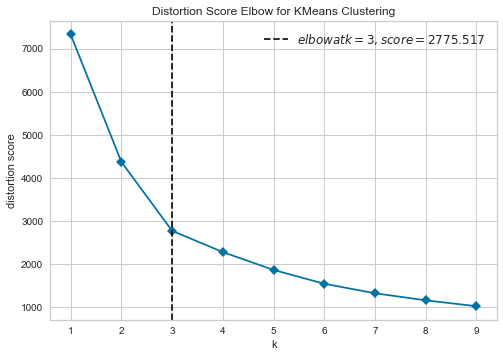

In [77]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

modelo=KMeans()
visual=KElbowVisualizer(modelo, k=(1,10),timings=False)
visual.fit(df_kmeans)
visual.poof();

#By default, the scoring parameter metric is set to distortion, which computes the sum of squared distances from each point to 
#its assigned center. However, two other metrics can also be used with the KElbowVisualizer – silhouette and calinski_harabasz.
#The silhouette score calculates the mean Silhouette Coefficient of all samples, while the calinski_harabasz score computes the 
#ratio of dispersion between and within clusters.

In [73]:
kmeans=KMeans(n_clusters=3)
kmeans.fit(df_kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [74]:
y_pred=kmeans.predict(df_kmeans)

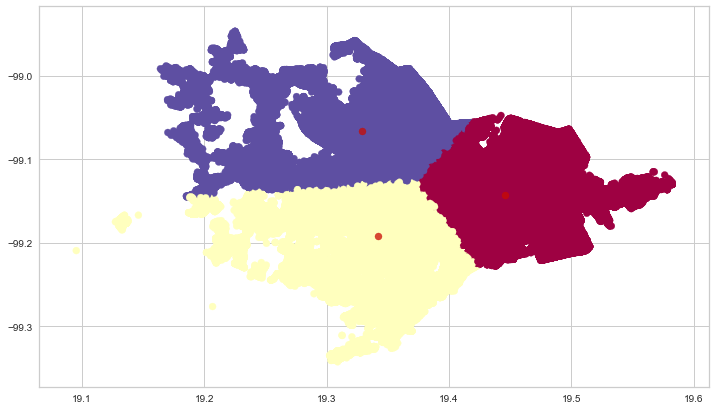

In [78]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,7))
plt.scatter(df_kmeans.latitud, df_kmeans.longitud, c=y_pred, cmap='Spectral');

centers=kmeans.cluster_centers_
plt.scatter(centers[:,0], centers[:,1], c='r', s=50, alpha=.75);

plt.show();

Observaciones:
- El cluster de color púrpura representa a la zonas con más nivel socioeconómico en la CDMX.
- Los otros dos clusters corresponden principalmente a Iztapalada y la zona sur de la ciudad, en donde el nivel socioeconómico es más bajo.

### 12. Toma los delitos clasificados como “Robo a pasajero abordo de transporte público con y sin violencia”. ¿Cuáles son las ruta de transporte público donde más ocurren estos delitos?

In [24]:
df[df.delito.str.contains('ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO')].delito.unique() #Acá se incluyen a los dos tipos de delito

array(['ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO SIN VIOLENCIA',
       'ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO CON VIOLENCIA'],
      dtype=object)

In [25]:
df12=df[df.delito.str.contains('ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO')]
df12.head()

,ao_hechos,mes_hechos,fecha_hechos,delito,categoria_delito,fiscalia,agencia,unidad_investigacion,alcaldia_hechos,colonia_hechos,ao_inicio,mes_inicio,fecha_inicio,calle_hechos,longitud,latitud,geopoint
136,2019.0,Septiembre,2019-09-15 14:05:00,ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO ...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN AGENCIAS DE ATENCIÓN ESPECIAL...,LGBTTTI,3 CON DETENIDO,CUAUHTEMOC,BUENAVISTA,2019,Septiembre,2019-09-15 14:27:39,AVENIDA BUENAVISTA ESQUINA OROZCO Y BERRA,-99.152946,19.440122,"19.440121697,-99.1529459"
376,2019.0,Septiembre,2019-09-16 07:30:00,ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO ...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN IZTAPALAPA,IZP-9,UI-2SD,IZTAPALAPA,1RA. AMPLIACIÓN SANTIAGO ACAHUALTEPEC,2019,Septiembre,2019-09-17 11:20:54,CAMINO A SANTIAGO,-99.010248,19.354151,"19.3541508771,-99.0102484101"
485,2019.0,Septiembre,2019-09-16 20:40:00,ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO ...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN MAGDALENA CONTRERAS,MC-2,UI-2CD,LA MAGDALENA CONTRERAS,PALMAS,2019,Septiembre,2019-09-17 17:32:58,PALMAS,-99.247950,19.314977,"19.3149769988,-99.2479496805"
490,2019.0,Septiembre,2019-09-17 17:00:00,ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO ...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN IZTAPALAPA,IZP-6,UI-2CD,IZTAPALAPA,DESARROLLO URBANO QUETZALCOATL,2019,Septiembre,2019-09-17 18:03:10,TARASCO,-99.043397,19.318097,"19.3180966529,-99.0433967057"
653,2019.0,Septiembre,2019-09-17 16:00:00,ROBO A PASAJERO A BORDO DE TRANSPORTE PÚBLICO ...,DELITO DE BAJO IMPACTO,INVESTIGACIÓN EN COYOACÁN,COY-2,UI-3CD,COYOACAN,EL ROSEDAL,2019,Septiembre,2019-09-18 11:11:36,DIVISION DEL NORTE,-99.148572,19.341520,"19.341520077,-99.1485719402"


In [31]:
import plotly.express as px
mapbox_access_token = "pk.eyJ1IjoibHVpc2ZlcmxjMTUxNSIsImEiOiJjazUydm50ZjIwMjUxM2pudzFkMDhkaTYwIn0.NQDEMChu5p542DxB9j7d7g" 

fig3 = px.scatter_mapbox(df12, lat="latitud", lon="longitud", #hover_name="alcaldia_hechos", hover_data=["delito_x", "homicidios_anual_100mil", "colonia_hechos"],
                        color_discrete_sequence= ['black'],zoom=10, height=450)
fig3.update_layout(mapbox_style="light", mapbox_accesstoken=mapbox_access_token)
fig3.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig3.show()

In [32]:
fig3.write_html("A2_Ex12.html")

Los puntos que marcan la ruta 51 estan tan unidos que parecen un línea. Acá una imágen de esta ruta

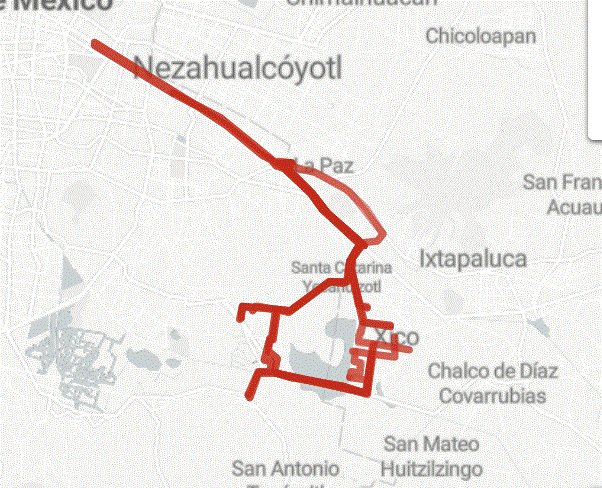

También la ruta 112 con ID 307 y 310 son puntos que resaltan en el scattermap.

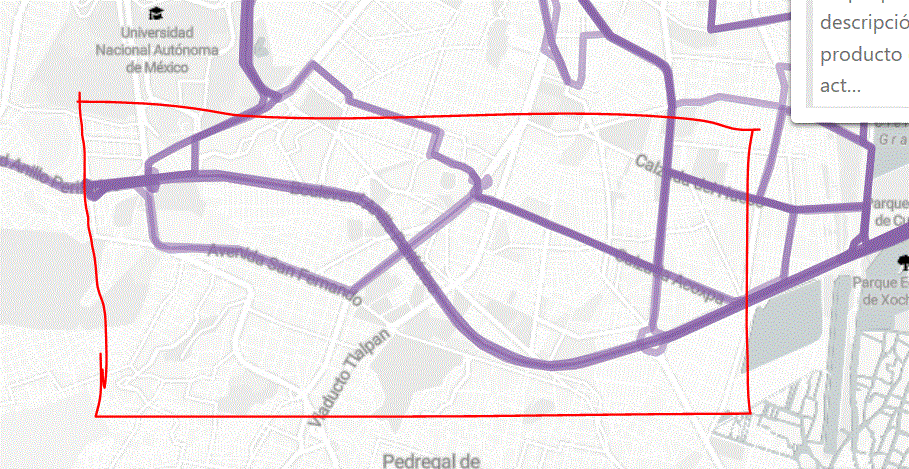

Datos de las rutas de la CDMX: https://datos.cdmx.gob.mx/explore/dataset/rutas-y-corredores-del-transporte-publico-concesionado/custom/?location=11,19.41933,-99.08226

---